In [1]:
import numpy as np
import sklearn
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

import time

from sklearn import tree
from sklearn.tree import export_graphviz
from IPython.display import Image 
import pydotplus

Import in the observed data and see how it compares. Afterwards, repeat with inverted, and scrambbled data. the tests above have been done with the injected data.

In [2]:
# load the other three false positive datasets, and assign your own label
fp_Data = ["kplr_dr25_scr1_robovetter_input.txt", "kplr_dr25_inj2_robovetter_input.txt", "kplr_dr25_inj3_robovetter_input.txt"]
#class labels, 2 = scrammbled data, 3 = off planet injections, 5 is the injectied ecipsing binaries
n = 97 #num of cols
total_fp_data = np.empty(shape=[0, n])
total_fp_labels = np.empty(shape = [0,1]) # false positives lables
for i, file_name in enumerate(fp_Data):
    data = np.loadtxt(file_name, dtype=object , skiprows=223 ) 

    new_data = data[:, 4:] # get rid og the dataset label, TCE_ID, the KIC_ID, and pn
    print new_data.shape, total_fp_data.shape
    new_data = new_data.astype("float") # feautres
    total_fp_data = np.append(total_fp_data, new_data, axis = 0)
    labels = np.empty(shape=[new_data.shape[0],1])
    labels.fill(i+2)
    #print labels[0]
    total_fp_labels = np.append(total_fp_labels, labels)
print total_fp_data.shape, total_fp_labels.shape

(24213, 97) (0, 97)
(18897, 97) (24213, 97)
(10502, 97) (43110, 97)
(53612, 97) (53612,)


In [3]:
false_y = np.zeros(total_fp_data.shape[0])
print false_y.shape

data = np.loadtxt("kplr_dr25_inj1_robovetter_input.txt", dtype=object , skiprows=223 ) #[223:]
pc_data = data[:, 4:]
pc_data = pc_data.astype("float") # feautres
pc_y = np.ones(pc_data.shape[0])
print pc_y.shape

(53612,)
(45377,)


Concatenate all the data, and then shuffle, set a seed, remove a holdout set, and then use crossvalidation on the remaining data

In [4]:
totalX = np.vstack([total_fp_data, pc_data])
totalY = np.hstack([false_y, pc_y])
classlabels = np.hstack([total_fp_labels, pc_y])
#shuffle then split
shuffleX, shuffleY, shuffle_labels = shuffle(totalX, totalY, classlabels, random_state = 0)


In [5]:
#create holdout set
keepX,  holdoutX, keepY, holdoutY , keep_labels, holdout_labels= train_test_split(shuffleX, shuffleY, shuffle_labels, test_size = 0.2, random_state = 0)
print keepX.shape, holdoutX.shape

(79191, 97) (19798, 97)


In [6]:
rfc = RandomForestClassifier(random_state=0, n_estimators=100, max_depth=10)
start = time.time()
score = cross_val_score(rfc, keepX, keepY, cv = 5, scoring="average_precision", verbose=True )
print score 
print "Average score", np.mean(score), "Standard Deviation", np.std(score)
end = time.time()
print("Total evaluation time %f" % (end - start))

[ 0.92123226  0.91617296  0.91500341  0.91414929  0.92325856]
Average score 0.917963294502 Standard Deviation 0.00361216741374
Total evaluation time 201.848305


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  3.4min finished


In [7]:
#print rfc.feature_importances_
#load labels, create pandaframe, and then run a fit to determine the most important features
data = pd.read_table("kplr_dr25_inj1_robovetter_input.txt",  skiprows=219 , sep= "|", nrows=1) #[223:]
data.rename(columns=lambda x: x.strip(), inplace=True)
del data["Unnamed: 0"]
del data["Unnamed: 102"]
del data["Data_Set"]
#print data.columns.values
del data["TCE_ID"]
del data["KIC"]
del data["pn"]

In [8]:
data

,n_plan,ntrans,nrealt,ngoodt,iflag0,iflag1,iflag2,iflag3,iflag4,iflag5,...,rp_alt_merr,alb_alt,alb_alt_perr,alb_alt_merr,mod_depth_pri_alt,mod_depth_sec_alt,mod_ph_sec_alt,mod_ph_ter_alt,sdepthsig_dv,sdepthsig_alt
0,int,int,int,int,int,int,int,int,int,int,...,double,double,double,double,double,double,double,double,double,double


In [9]:
vals = data.columns.values
print vals
labelled_data = pd.DataFrame(keepX, columns=vals)
labelled_data.head()

['n_plan' 'ntrans' 'nrealt' 'ngoodt' 'iflag0' 'iflag1' 'iflag2' 'iflag3'
 'iflag4' 'iflag5' 'cflag0' 'cflag1' 'cflag2' 'cflag3' 'cflag4' 'cflag5'
 'cflag6' 'cflag7' 'cflag8' 'ephem_disp' 'cent_disp' 'cent_score' 'period'
 'period_err' 'epoch' 'epoch_err' 'duration' 'duration_err' 'impact'
 'impact_err' 'depth' 'depth_err' 'depth_alt' 'sma' 'rstar' 'mes'
 'ses_to_mes' 'new_mes' 'lpp_dv' 'lpp_alt' 'all_tran_chases' 'sweet_snr'
 'sweet_amp' 'shape_metric' 'halo_ghost' 'mod_sig_pri_dv' 'mod_sig_sec_dv'
 'mod_sig_ter_dv' 'mod_sig_pos_dv' 'mod_fred_dv' 'mod_fa1_dv' 'mod_fa2_dv'
 'mod_sig_pri_alt' 'mod_sig_sec_alt' 'mod_sig_ter_alt' 'mod_sig_pos_alt'
 'mod_fred_alt' 'mod_fa1_alt' 'mod_fa2_alt' 'modshiftval1_dv'
 'modshiftval2_dv' 'modshiftval3_dv' 'modshiftval4_dv' 'modshiftval5_dv'
 'modshiftval6_dv' 'modshiftval1_alt' 'modshiftval2_alt' 'modshiftval3_alt'
 'modshiftval4_alt' 'modshiftval5_alt' 'modshiftval6_alt' 'oesig_dv'
 'oesig_alt' 'mod_oe_dv' 'mod_oe_alt' 'rp_dv' 'rp_dv_perr' 'rp_dv_me

,n_plan,ntrans,nrealt,ngoodt,iflag0,iflag1,iflag2,iflag3,iflag4,iflag5,...,rp_alt_merr,alb_alt,alb_alt_perr,alb_alt_merr,mod_depth_pri_alt,mod_depth_sec_alt,mod_ph_sec_alt,mod_ph_ter_alt,sdepthsig_dv,sdepthsig_alt
0,2.0,53.0,48.0,47.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.26,182.914,119.631,81.737,0.000180,0.000020,0.787074,0.345440,0.372770,0.387618
1,1.0,3.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.68,1160.058,1596.432,612.859,0.000327,0.000037,0.567986,0.315325,-1.000000,-1.000000
2,2.0,42.0,36.0,36.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.29,97.950,47.438,38.813,0.000307,0.000029,0.538255,0.423581,0.057388,0.057638
3,1.0,517.0,474.0,300.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.99,9.481,76.218,7.109,0.000162,0.000047,0.367231,0.090526,0.108865,0.162678
4,1.0,51.0,48.0,47.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.53,368.732,306.647,148.355,0.000951,0.000131,0.986083,0.049078,0.171634,0.697469


In [10]:
trainX, testX, trainY, testY, train_label, test_label = train_test_split(labelled_data, keepY, keep_labels, random_state = 0
                                                                         ,test_size = 0.2)
rfc.fit(trainX, trainY)
print rfc.feature_importances_

[  5.09429527e-02   6.31654864e-04   1.81864006e-03   2.66645104e-02
   3.18698370e-02   1.54465890e-03   4.90450919e-04   3.27510304e-04
   1.63596816e-04   3.49597868e-05   2.31225851e-04   2.04660226e-05
   2.44118887e-04   2.83405203e-06   1.57067736e-04   3.66297353e-02
   1.34092164e-03   1.62170033e-04   5.51220633e-03   1.79027348e-06
   1.75103505e-02   2.95840798e-02   2.19107815e-03   1.46737662e-03
   6.25502008e-04   1.98905832e-02   2.30325703e-03   1.34164928e-02
   5.11792377e-04   5.58280497e-04   8.59464685e-03   2.31504930e-03
   6.33424700e-03   1.50888024e-03   2.13539610e-03   7.28591519e-02
   2.45007510e-02   1.23439745e-01   4.24690577e-02   1.56773245e-02
   7.54000321e-03   7.13407390e-04   1.24786087e-03   7.48890154e-04
   1.19586010e-01   2.37784270e-02   1.84560576e-03   1.32330251e-03
   1.81090716e-03   1.81108502e-03   5.98924900e-03   3.62185890e-03
   1.26467005e-02   5.92169925e-03   2.57435541e-03   7.59552648e-04
   1.07339605e-03   7.25770083e-03

In [11]:
preds = rfc.predict(testX)
from sklearn import metrics


Model Report
Accuracy : 0.9068
['new_mes', 'halo_ghost', 'mes', 'n_plan', 'modshiftval1_dv', 'lpp_dv', 'cflag5', 'modshiftval3_dv', 'iflag0', 'modshiftval2_dv', 'cent_score', 'ngoodt', 'ses_to_mes', 'mod_sig_pri_dv', 'epoch_err', 'cent_disp', 'lpp_alt', 'rp_dv', 'modshiftval6_alt', 'modshiftval6_dv']


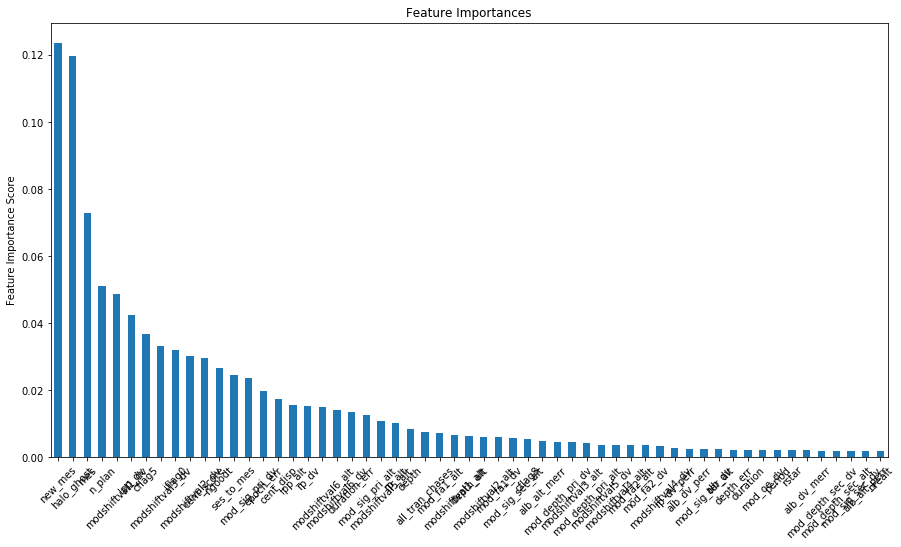

In [12]:
# feature importances
feat_imp = pd.Series(rfc.feature_importances_).sort_values(ascending=False)[:-40]
indices = np.argsort(rfc.feature_importances_)[::-1][:-40]

#mapped dict
mapped_vals = {i: val for (i, val) in enumerate(labelled_data.columns.values)}

fig = plt.figure()
ax = fig.add_subplot("111")
feat_imp.plot(kind='bar', title='Feature Importances', figsize=(15,8))
plt.ylabel('Feature Importance Score')

feat_labels = [mapped_vals[x] for x in indices]
ax.set_xticklabels(rotation=45 ,labels=feat_labels)

#Print model report:
print "\nModel Report"
print "Accuracy : %.4g" % metrics.average_precision_score(testY, preds)

print feat_labels[:20] #print top 20 features

In [13]:
from sklearn.metrics import confusion_matrix
print confusion_matrix(testY, preds, labels = [1,0])

[[6748  572]
 [1138 7381]]


In [14]:
rfc2 = RandomForestClassifier(n_estimators=1000, random_state=0,  n_jobs=-1  , max_depth=15)
#print rfc
start = time.time()
score = cross_val_score(rfc, keepX, keepY, cv = 5, scoring="average_precision", verbose=3)
print score 
print "Average score", np.mean(score), "Standard Deviation", np.std(score)
end = time.time()
print("Total evaluation time %f" % (end - start))

[CV]  ................................................................
[CV] ................................. , score=0.921232, total=  36.8s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   36.9s remaining:    0.0s


[CV] ................................. , score=0.916173, total=  40.0s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.3min remaining:    0.0s


[CV] ................................. , score=0.915003, total=  37.4s
[CV]  ................................................................
[CV] ................................. , score=0.914149, total=  35.1s
[CV]  ................................................................
[CV] ................................. , score=0.923259, total=  37.5s
[ 0.92123226  0.91617296  0.91500341  0.91414929  0.92325856]
Average score 0.917963294502 Standard Deviation 0.00361216741374
Total evaluation time 186.946922


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  3.1min finished


In [19]:
dtree = tree.DecisionTreeClassifier(max_depth = 10)

dtree.fit(keepX, keepY)
dot_data = tree.export_graphviz(dtree, out_file=None, 
                         feature_names=vals  ,
                         class_names=["1", "0"],  
                         filled=True,   
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  

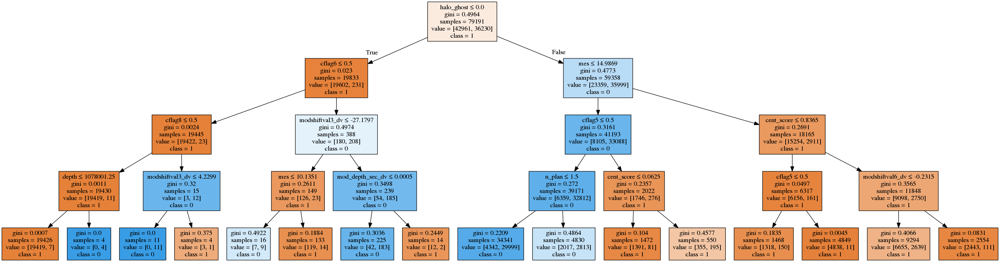

In [20]:
Image(graph.create_png()) 


In [102]:
Image(graph.create_png()) 
#dot_data = rfc.export_graphviz(rfc, out_file= None, feature_names = vals)
#graph = pydotplus.graph_from_dot_data(dot_data)  
#Image(graph.create_png())

#dot_data = tree.export_graphviz(clf, out_file=None, 
#                         feature_names=iris.feature_names,  
#                         class_names=iris.target_names,  
#                         filled=True, rounded=True,  
#                         special_characters=True)  
#>>> graph = pydotplus.graph_from_dot_data(dot_data)  
#>>> Image(graph.create_png())  

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.240263 to fit



In [14]:
dtree = tree.DecisionTreeClassifier(max_depth=10)

dtree.fit(trainX, trainY)
dot_data = tree.export_graphviz(dtree, out_file=None, 
                         feature_names=vals ,
                         class_names=["1", "0"],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png()) 


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.91027 to fit



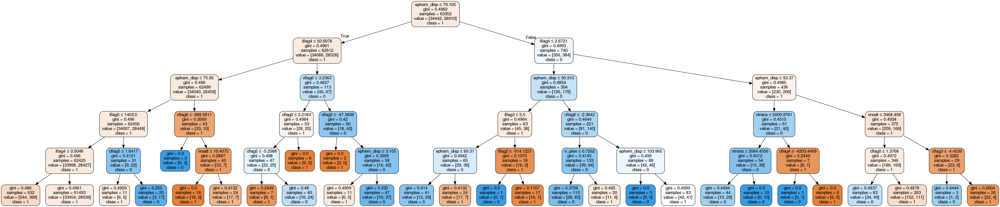

In [101]:
dtree = tree.DecisionTreeClassifier(max_depth=5, random_state = 0)

dtree.fit(trainX, trainY)
dot_data = tree.export_graphviz(dtree, out_file=None, 
                         feature_names=vals  ,
                         class_names=["1", "0"],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png()) 


In [37]:
print feat_labels
reduced_feat = labelled_data[feat_labels[:20]]
print reduced_feat.shape
print reduced_feat.columns.values
#print reduced_feat

import_feats = ["halo_ghost" ,"ses_to_mes", 'all_tran_chases', "shape_metric", 'modshiftval3_alt',
                'modshiftval2_alt', 'modshiftval1_alt', 'modshiftval1_dv' , 'modshiftval2_dv' , 'modshiftval3_dv' ,
               'oesig_dv', 'oesig_alt', 'mod_oe_dv', 'mod_oe_alt', "lpp_alt", "lpp_dv", 'modshiftval4_dv',
               'modshiftval5_dv', 'modshiftval6_dv', 'modshiftval4_alt', 'modshiftval5_alt', 'modshiftval6_alt']

#reduced_feat = reduced_feat+ labelled_data[import_feats]
#print reduced_feat.shape
#print len(np.where(reduced_feat==np.inf)[0])
#reduced_feat.head

import_data = labelled_data[import_feats]
import_data.head(1)
new_df = pd.merge(reduced_feat, import_data)
print new_df.shape
new_df.head()

['new_mes', 'halo_ghost', 'mes', 'n_plan', 'modshiftval1_dv', 'lpp_dv', 'cflag5', 'modshiftval3_dv', 'iflag0', 'modshiftval2_dv', 'cent_score', 'ngoodt', 'ses_to_mes', 'mod_sig_pri_dv', 'epoch_err', 'cent_disp', 'lpp_alt', 'rp_dv', 'modshiftval6_alt', 'modshiftval6_dv', 'duration_err', 'mod_sig_pri_alt', 'modshiftval5_alt', 'rp_alt', 'depth', 'all_tran_chases', 'mod_fa1_alt', 'modshiftval1_alt', 'depth_alt', 'modshiftval2_alt', 'mod_fa1_dv', 'mod_sig_sec_alt', 'cflag8', 'alb_alt_merr', 'mod_depth_pri_dv', 'modshiftval3_alt', 'mod_depth_pri_alt', 'modshiftval5_dv', 'modshiftval4_alt', 'mod_fa2_alt', 'mod_fa2_dv', 'modshiftval4_dv', 'rp_dv_perr', 'alb_dv_perr', 'mod_sig_ter_alt', 'alb_dv', 'depth_err', 'duration', 'mod_oe_dv', 'period', 'rstar', 'alb_dv_merr', 'mod_depth_sec_dv', 'mod_depth_sec_alt', 'mod_sig_sec_dv', 'alb_alt_perr', 'nrealt']
(79191, 20)
['new_mes' 'halo_ghost' 'mes' 'n_plan' 'modshiftval1_dv' 'lpp_dv' 'cflag5'
 'modshiftval3_dv' 'iflag0' 'modshiftval2_dv' 'cent_score' 

,new_mes,halo_ghost,mes,n_plan,modshiftval1_dv,lpp_dv,cflag5,modshiftval3_dv,iflag0,modshiftval2_dv,...,modshiftval2_alt,modshiftval1_alt,oesig_dv,oesig_alt,mod_oe_dv,mod_oe_alt,modshiftval4_dv,modshiftval5_dv,modshiftval4_alt,modshiftval5_alt
0,18.012275,0.009888,17.815766,2.0,-16.103924,0.889788,0.0,-21.362257,0.0,-20.956415,...,-22.045733,-24.482736,0.070550,0.058458,0.635341,0.852402,-1.615864,-2.179531,-1.844708,-2.389889
1,12.589245,0.086609,12.589245,1.0,-14.101086,0.858634,0.0,-23.931085,0.0,-23.593291,...,-17.283626,-28.773870,0.000000,0.000000,1.329877,0.964996,-1.639655,-1.955472,-1.382396,-2.750553
2,22.238096,0.237542,22.238096,2.0,-23.657244,0.489647,0.0,-26.156675,0.0,-26.569576,...,-25.553645,-26.269966,0.065670,0.192011,1.216662,3.099259,-2.170420,-2.252421,-2.119036,-2.380978
3,14.979813,1.573072,7.566472,1.0,-4.533379,0.714416,0.0,-5.703928,0.0,-6.543859,...,-6.312490,-4.784329,0.012425,0.119160,0.806181,1.344584,-2.685292,-2.027667,-2.023943,-1.379548
4,23.883295,0.606922,24.059217,1.0,-19.992996,0.854487,1.0,-25.278346,0.0,-25.930892,...,-23.276959,-21.071964,0.050125,0.199772,1.001386,0.224466,-1.376069,-1.256737,-1.509079,-2.007940


In [38]:
trainX, testX, trainY, testY , train_label, test_label = train_test_split(new_df, keepY,keep_labels, random_state = 0, test_size = .2)
print trainX.shape, testX.shape, train_label.shape

(63352, 33) (15839, 33) (63352,)


In [39]:
rfc = RandomForestClassifier(n_estimators=500, max_depth=15, random_state = 0)
#rfc = RandomForestClassifier(n_estimators=100, max_depth=10, max_features=0.5) # score of 92.3

score = cross_val_score(rfc, reduced_feat, keepY, cv = 5,  verbose = 5, scoring = "average_precision", n_jobs = -1)
print score
print np.mean(score), np.std(score)

[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV] ................................. , score=0.923847, total= 2.9min
[CV]  ................................................................
[CV] ................................. , score=0.928830, total= 2.9min


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  2.9min remaining:  4.3min


[CV] ................................. , score=0.921984, total= 2.9min
[CV] ................................. , score=0.924635, total= 2.9min
[CV] ................................. , score=0.929019, total= 1.5min
[ 0.9288299   0.92384724  0.9219844   0.92463494  0.92901865]
0.925663027645 0.0027991325422


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  4.4min finished


In [45]:
rfc = RandomForestClassifier(n_estimators=500, max_depth=15, random_state = 5, n_jobs=-1)

score = cross_val_score(rfc, new_df, keepY, cv = 5,  verbose = 5, scoring = "average_precision", n_jobs = -1)
print score
print np.mean(score), np.std(score)

[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV] ................................. , score=0.928446, total= 4.2min
[CV]  ................................................................
[CV] ................................. , score=0.924036, total= 4.2min
[CV] ................................. , score=0.922232, total= 4.2min


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  4.3min remaining:  6.4min


[CV] ................................. , score=0.921889, total= 4.3min
[CV] ................................. , score=0.929042, total=  56.9s
[ 0.92844557  0.92223166  0.92188916  0.92403623  0.9290424 ]
0.925129003213 0.00304629880639


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  5.2min finished


In [43]:
# try with just important features, and see how the splits compare
#trainX, testX, trainY, testY , train_label, test_label = train_test_split(new_df, keepY,keep_labels, random_state = 0, test_size = .2)
#print trainX.shape, testX.shape, train_label.shape
rfc = RandomForestClassifier(n_estimators=1000, max_depth=15, random_state = 5)

score = cross_val_score(rfc, new_df[import_feats], keepY, cv = 5, verbose = 5, scoring = "average_precision", n_jobs = -1)
print score
print np.mean(score), np.std(score)

[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV] ................................. , score=0.876547, total= 7.6min
[CV]  ................................................................
[CV] ................................. , score=0.882606, total= 7.6min


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  7.6min remaining: 11.4min


[CV] ................................. , score=0.881167, total= 7.6min
[CV] ................................. , score=0.882169, total= 7.6min
[CV] ................................. , score=0.880377, total= 4.2min
[ 0.88260627  0.88116741  0.87654665  0.88216878  0.88037713]
0.880573248847 0.00215795766163


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 11.8min finished


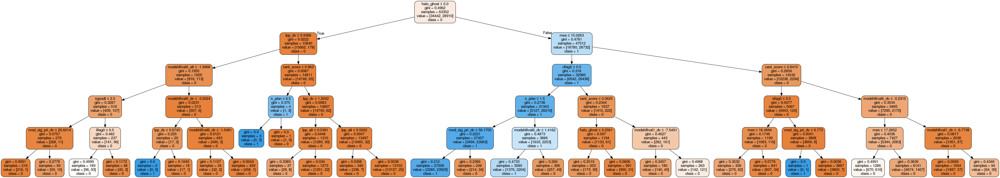

In [19]:
#print out tree, and see if the splits are any different now with the reduced features
dtree = tree.DecisionTreeClassifier(max_depth=5, random_state = 0)

dtree.fit(trainX, trainY)
dot_data = tree.export_graphviz(dtree, out_file=None, 
                         feature_names=reduced_feat.columns.values,
                         class_names=["0", "1"],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png()) 


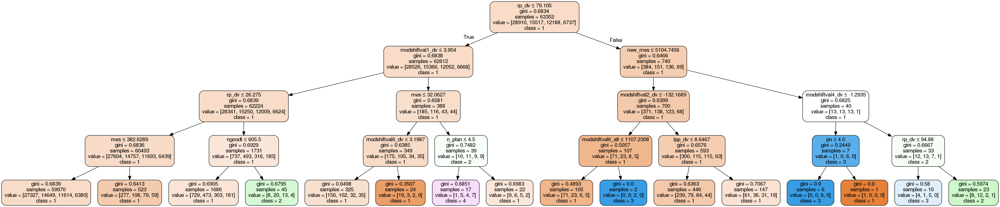

In [97]:
dtree = tree.DecisionTreeClassifier(max_depth=4, random_state = 0, max_features = 0.75)

dtree.fit(trainX, train_label)
dot_data = tree.export_graphviz(dtree, out_file=None, 
                         feature_names=reduced_feat.columns.values,
                         class_names=["1", "2", "3", "4"],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png()) 


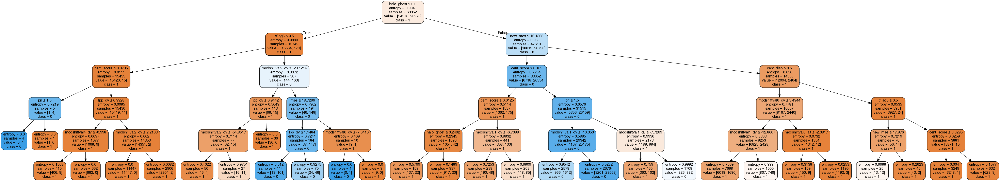

In [70]:
dtree = tree.DecisionTreeClassifier(max_depth=5, random_state = 0, max_features = 0.75, criterion="entropy")

dtree.fit(trainX, trainY)
dot_data = tree.export_graphviz(dtree, out_file=None, 
                         label= "all",
                         feature_names=reduced_feat.columns.values,
                         class_names=["1", "0"],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png()) 


In [22]:
# feature importances
rfc.fit(trainX, trainY)
print trainX.columns.values
indices = np.argsort(rfc.feature_importances_)[::-1]
print indices

['new_mes' 'halo_ghost' 'mes' 'n_plan' 'modshiftval1_dv' 'lpp_dv' 'cflag5'
 'modshiftval3_dv' 'iflag0' 'modshiftval2_dv' 'cent_score' 'ngoodt'
 'ses_to_mes' 'mod_sig_pri_dv' 'epoch_err' 'cent_disp' 'lpp_alt' 'rp_dv'
 'modshiftval6_alt' 'modshiftval6_dv']
[ 1  0  2  3  4  5 10  7 11  8  9  6 14 12 17 13 18 15 16 19]


['n_plan' 'ntrans' 'nrealt' 'ngoodt' 'iflag0' 'iflag1' 'iflag2' 'iflag3'
 'iflag4' 'iflag5' 'cflag0' 'cflag1' 'cflag2' 'cflag3' 'cflag4' 'cflag5'
 'cflag6' 'cflag7' 'cflag8' 'ephem_disp' 'cent_disp' 'cent_score' 'period'
 'period_err' 'epoch' 'epoch_err' 'duration' 'duration_err' 'impact'
 'impact_err' 'depth' 'depth_err' 'depth_alt' 'sma' 'rstar' 'mes'
 'ses_to_mes' 'new_mes' 'lpp_dv' 'lpp_alt' 'all_tran_chases' 'sweet_snr'
 'sweet_amp' 'shape_metric' 'halo_ghost' 'mod_sig_pri_dv' 'mod_sig_sec_dv'
 'mod_sig_ter_dv' 'mod_sig_pos_dv' 'mod_fred_dv' 'mod_fa1_dv' 'mod_fa2_dv'
 'mod_sig_pri_alt' 'mod_sig_sec_alt' 'mod_sig_ter_alt' 'mod_sig_pos_alt'
 'mod_fred_alt' 'mod_fa1_alt' 'mod_fa2_alt' 'modshiftval1_dv'
 'modshiftval2_dv' 'modshiftval3_dv' 'modshiftval4_dv' 'modshiftval5_dv'
 'modshiftval6_dv' 'modshiftval1_alt' 'modshiftval2_alt' 'modshiftval3_alt'
 'modshiftval4_alt' 'modshiftval5_alt' 'modshiftval6_alt' 'oesig_dv'
 'oesig_alt' 'mod_oe_dv' 'mod_oe_alt' 'rp_dv' 'rp_dv_perr' 'rp_dv_me

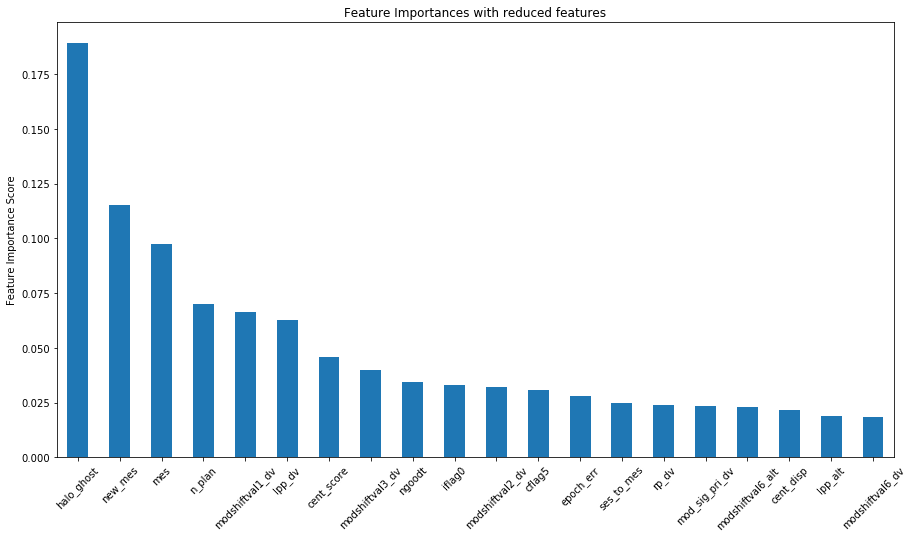

In [25]:
feat_imp = pd.Series(rfc.feature_importances_).sort_values(ascending=False)
print labelled_data.columns.values
#d = {key: value for (key, value) in iterable}
mapped_vals = {i: val for (i, val) in enumerate(reduced_feat.columns.values)}

fig = plt.figure()
ax = fig.add_subplot("111")
feat_imp.plot(kind='bar', title='Feature Importances with reduced features', figsize=(15,8))
plt.ylabel('Feature Importance Score')

feat_labels = [mapped_vals[x] for x in indices]
print indices
ax.set_xticklabels(rotation=45 ,labels=feat_labels)

print feat_labels

In [26]:
print reduced_feat["iflag0"].min() , reduced_feat["iflag0"].max() 
print dtree.classes_

0.0 1.0
[ 0.  1.]


In [27]:
import hyperopt
from hyperopt import  hp, fmin, tpe, STATUS_OK, Trials

In [ ]:
#try rerunning it with a larger parameter space for max depth becasue it was right at the edge
# define the parameter space and objective
space ={
        'max_depth': hp.quniform('x_max_depth', 1, 15,1),
        'min_child_weight': hp.quniform ('x_min_child', 1, 10, 1),
        'subsample': hp.uniform ('x_subsample', 0.8, 1),
        #'colsample_bytree': hp.uniform ('x_tree_colsample', 0.5,1),
        #'learning_rate': hp.uniform ('x_learning_rate', 0.001, 0.1)
}
# run same objective function.